In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os

In [2]:
# DATA IMPORT

files = [file for file in os.listdir('resale-flat-prices') if 'csv' in file]
data_folder = 'resale-flat-prices/'
data = pd.read_csv(data_folder + files[0])

for file in files[1:]:
    data = pd.concat([data, pd.read_csv(data_folder +file)])
    
data.month = pd.to_datetime(data.month, format = '%Y-%m')


In [3]:
# UNIQUE TOWNS

data.town.unique()

array(['ANG MO KIO', 'BEDOK', 'BISHAN', 'BUKIT BATOK', 'BUKIT MERAH',
       'BUKIT PANJANG', 'BUKIT TIMAH', 'CENTRAL AREA', 'CHOA CHU KANG',
       'CLEMENTI', 'GEYLANG', 'HOUGANG', 'JURONG EAST', 'JURONG WEST',
       'KALLANG/WHAMPOA', 'MARINE PARADE', 'PASIR RIS', 'PUNGGOL',
       'QUEENSTOWN', 'SEMBAWANG', 'SENGKANG', 'SERANGOON', 'TAMPINES',
       'TOA PAYOH', 'WOODLANDS', 'YISHUN', 'LIM CHU KANG'], dtype=object)

In [54]:
data

,month,town,flat_type,block,street_name,storey_range,floor_area_sqm,flat_model,lease_commence_date,resale_price,remaining_lease
0,2012-03-01,ANG MO KIO,2 ROOM,172,ANG MO KIO AVE 4,06 TO 10,45.0,Improved,1986,250000.0,NaN
1,2012-03-01,ANG MO KIO,2 ROOM,510,ANG MO KIO AVE 8,01 TO 05,44.0,Improved,1980,265000.0,NaN
2,2012-03-01,ANG MO KIO,3 ROOM,610,ANG MO KIO AVE 4,06 TO 10,68.0,New Generation,1980,315000.0,NaN
3,2012-03-01,ANG MO KIO,3 ROOM,474,ANG MO KIO AVE 10,01 TO 05,67.0,New Generation,1984,320000.0,NaN
4,2012-03-01,ANG MO KIO,3 ROOM,604,ANG MO KIO AVE 5,06 TO 10,67.0,New Generation,1980,321000.0,NaN
...,...,...,...,...,...,...,...,...,...,...,...
37148,2016-12-01,YISHUN,5 ROOM,297,YISHUN ST 20,13 TO 15,112.0,Improved,2000,488000.0,82
37149,2016-12-01,YISHUN,5 ROOM,838,YISHUN ST 81,01 TO 03,122.0,Improved,1987,455000.0,69
37150,2016-12-01,YISHUN,EXECUTIVE,664,YISHUN AVE 4,10 TO 12,181.0,Apartment,1992,778000.0,74
37151,2016-12-01,YISHUN,EXECUTIVE,325,YISHUN CTRL,01 TO 03,146.0,Maisonette,1988,575000.0,70


In [76]:
def plot_prices(data, town, rolling, show=False, focus=None):
    roll_min = 3
    if rolling < roll_min: rolling = roll_min
    sub = data[data['town'] == town]
    sub = sub.groupby(['street_name','month']).resale_price.mean().reset_index()
    sub = sub.pivot(index='street_name',columns='month', values='resale_price').transpose()
    sub = sub[sub.index.year > 1999]
    sub = sub[sub.columns[sub.isnull().mean() < 0.5]]
    sub = sub.rolling(rolling, min_periods = roll_min).mean(skipna=True)

    plt.rcParams.update({'font.size': 15})
    plt.figure(figsize=(20,20))
    for loc in sub.columns.values:
        if focus and loc not in focus:
            plt.plot(sub[loc], c='grey', alpha=0.2)
        else:
            plt.plot(sub[loc])
    plt.legend(sub.columns.values)
    plt.title('Resale Prices over times by Sub-town within {}'.format(town))
    plt.ylabel('Mean Price (Rolling = {} Months)'.format(rolling))
    plt.xlabel('Year')
    if focus:
            plt.savefig('diagrams/{}_roll_{}_FOCUS.jpg'.format(town.replace('/','-'), rolling))
    else:
            plt.savefig('diagrams/{}_roll_{}.jpg'.format(town.replace('/','-'), rolling))
    plt.tight_layout()
    if show:
        plt.show()
    plt.close()

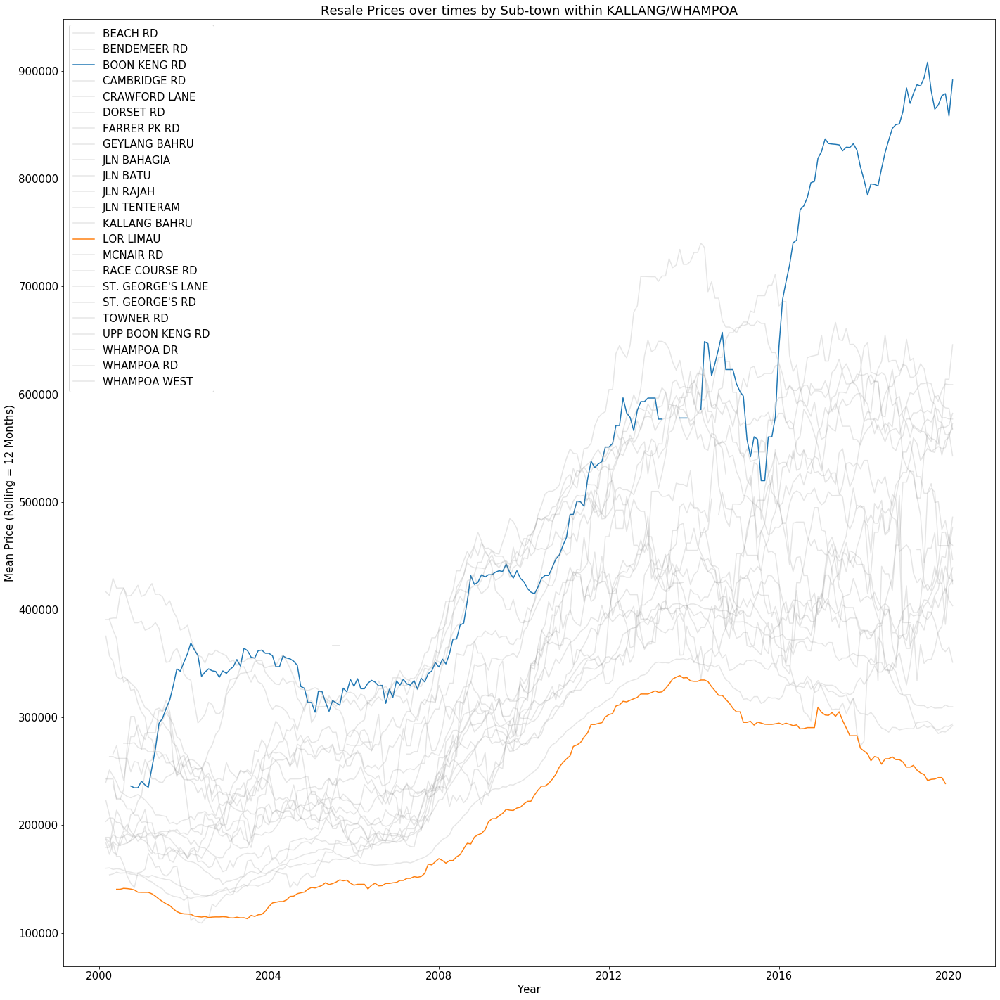

In [80]:
# DEMO : HIGHLIGHTING SPECIFIC LINES

my_town = 'KALLANG/WHAMPOA'
plot_prices(data, my_town, 12, show=True, focus=['BOON KENG RD', 'LOR LIMAU'])

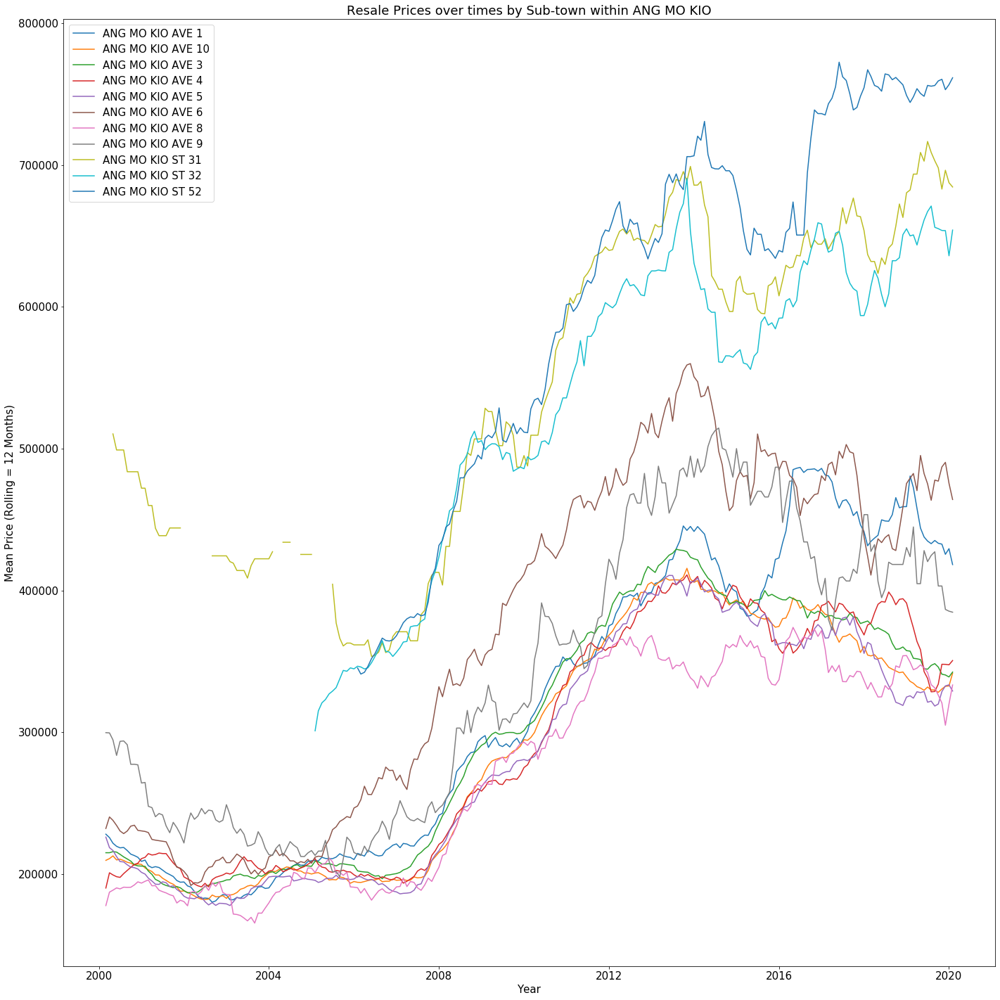

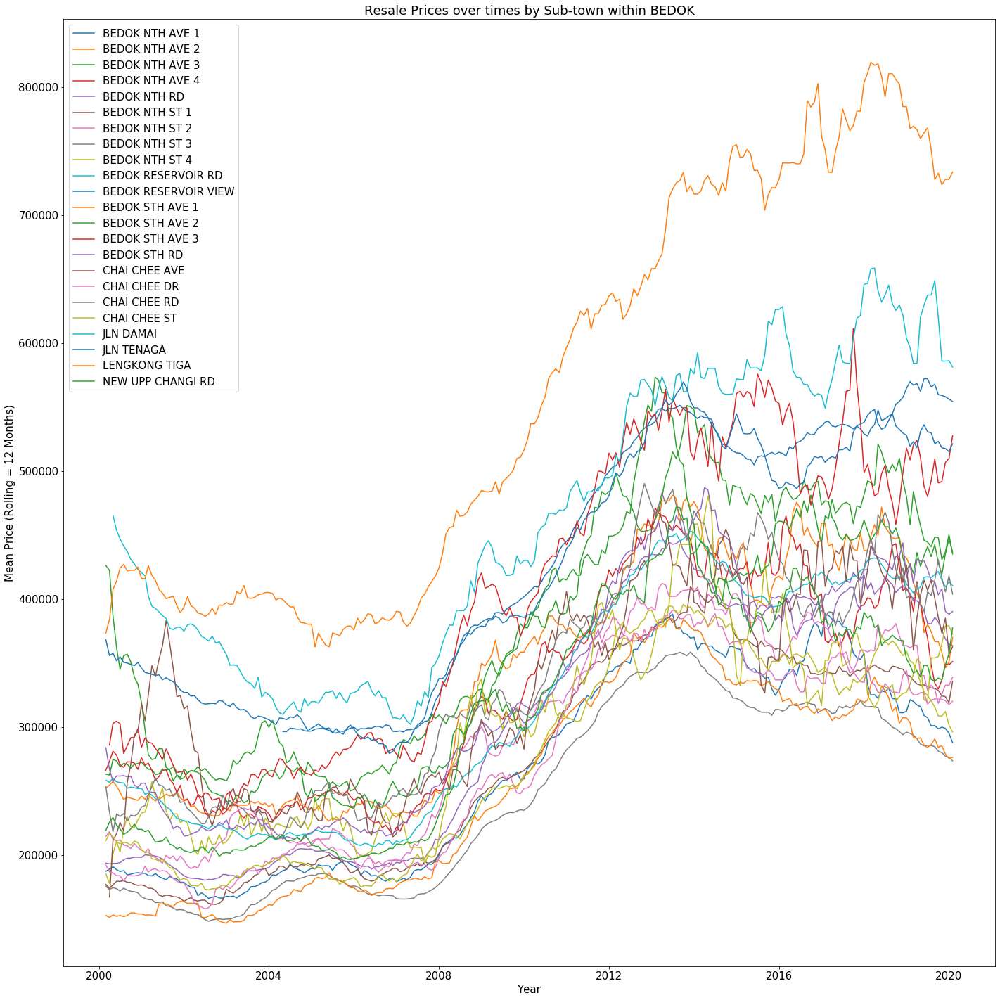

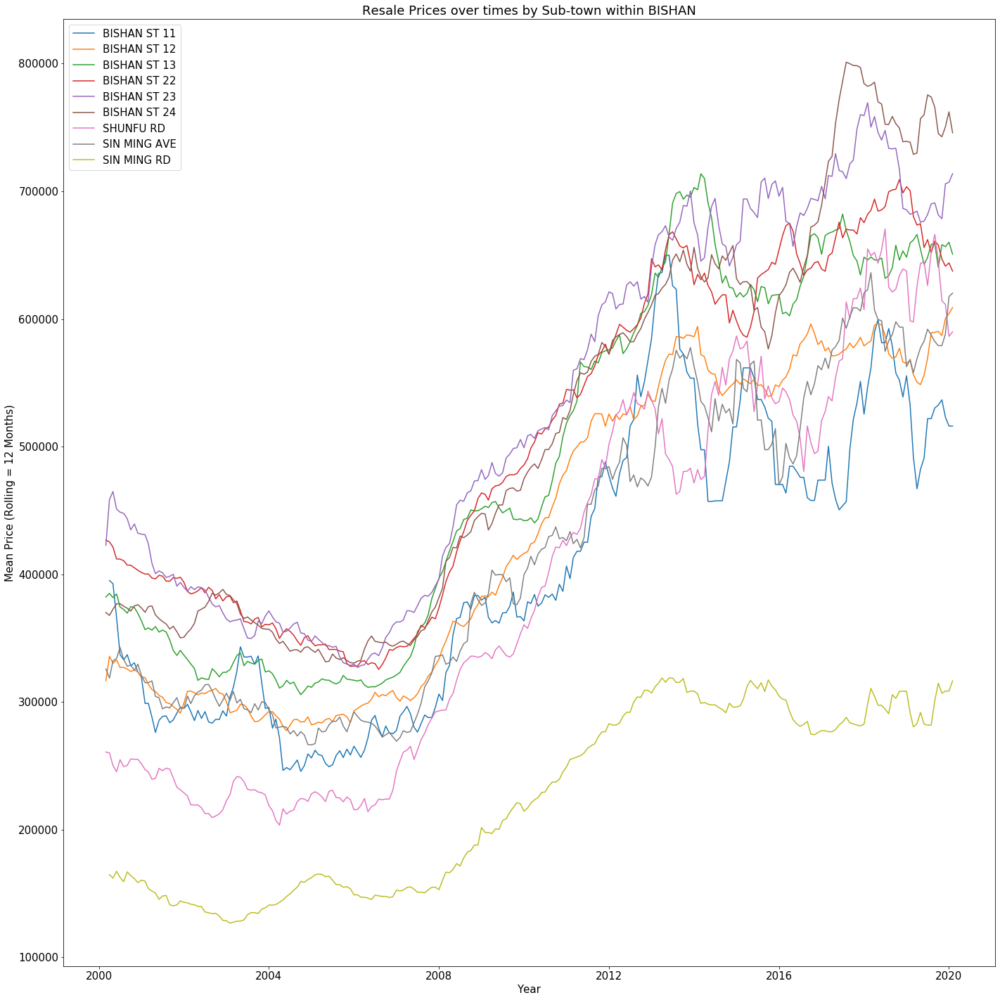

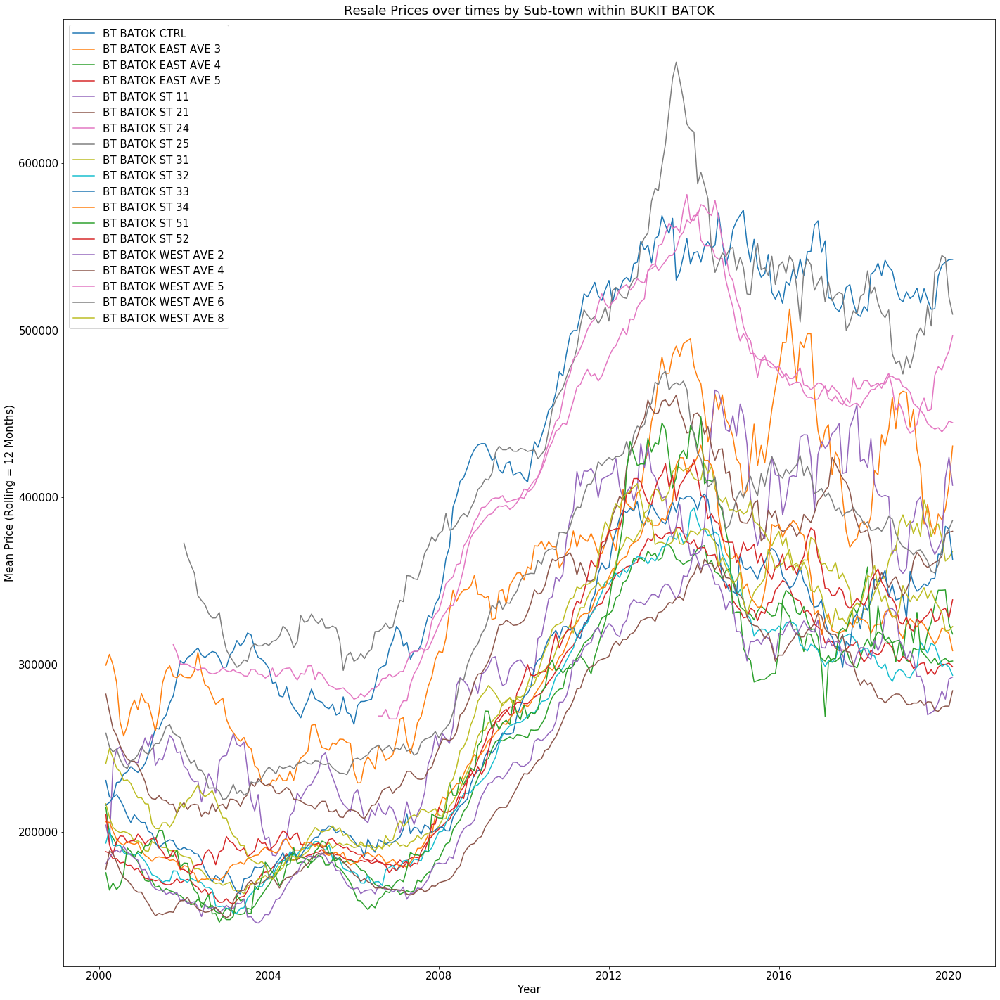

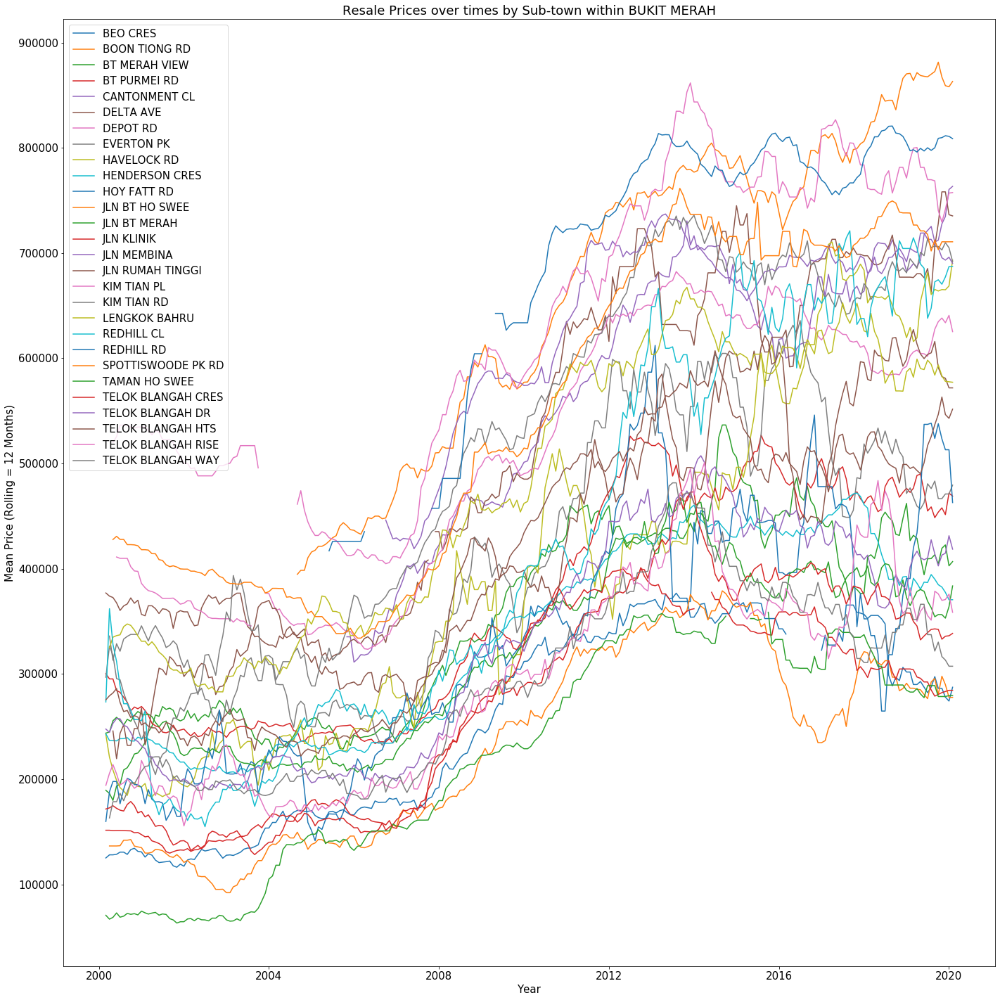

...

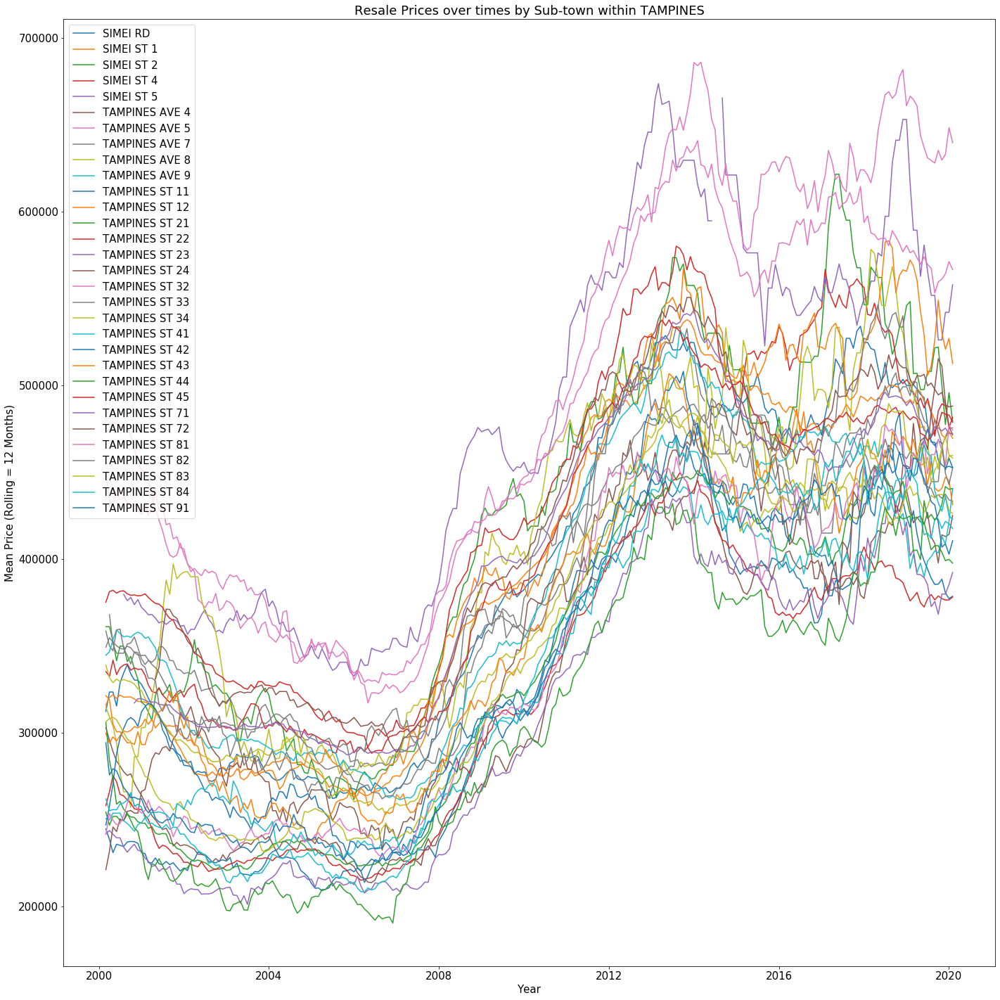

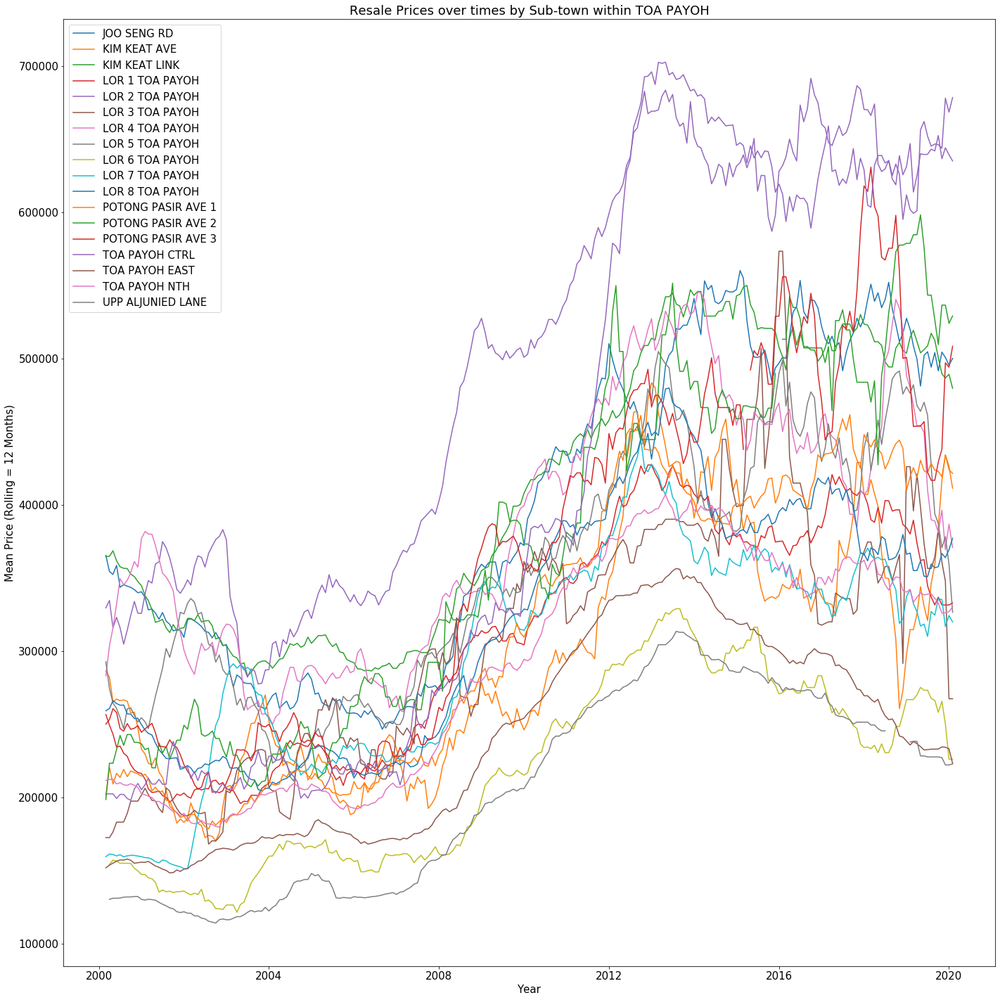

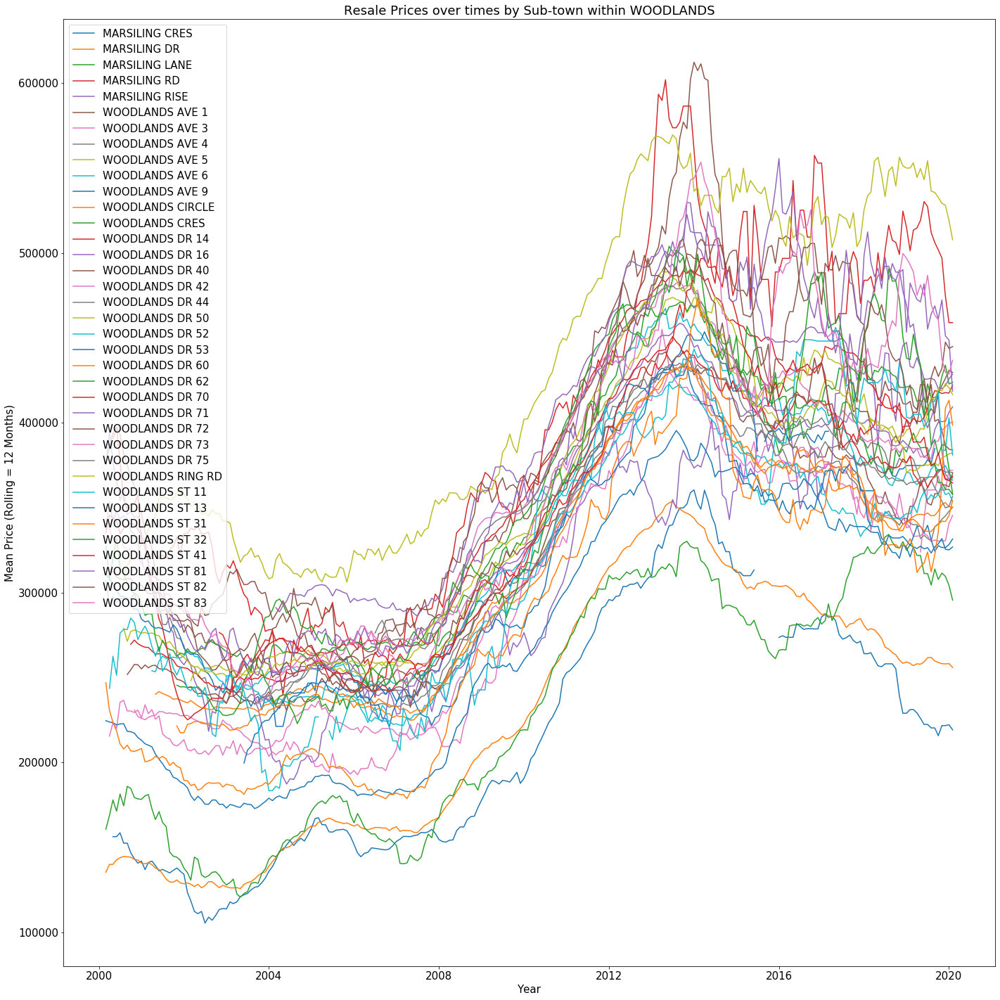

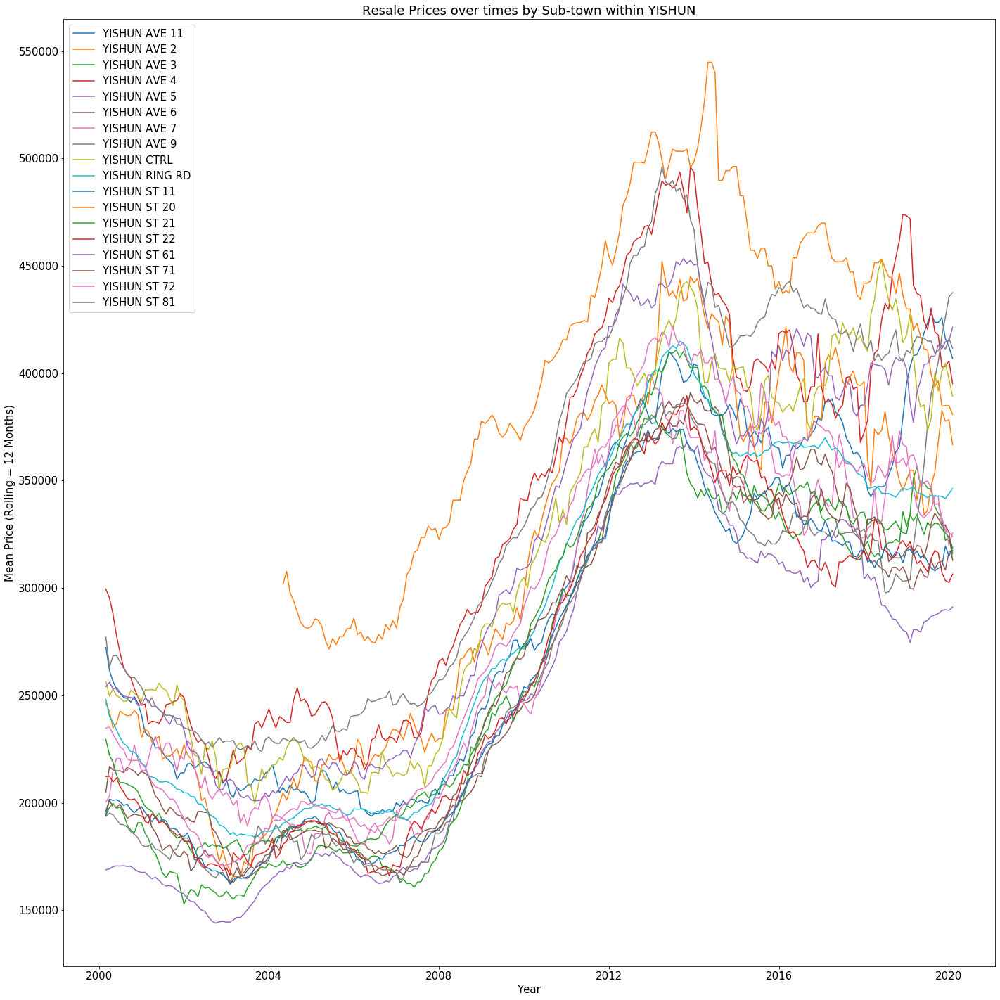

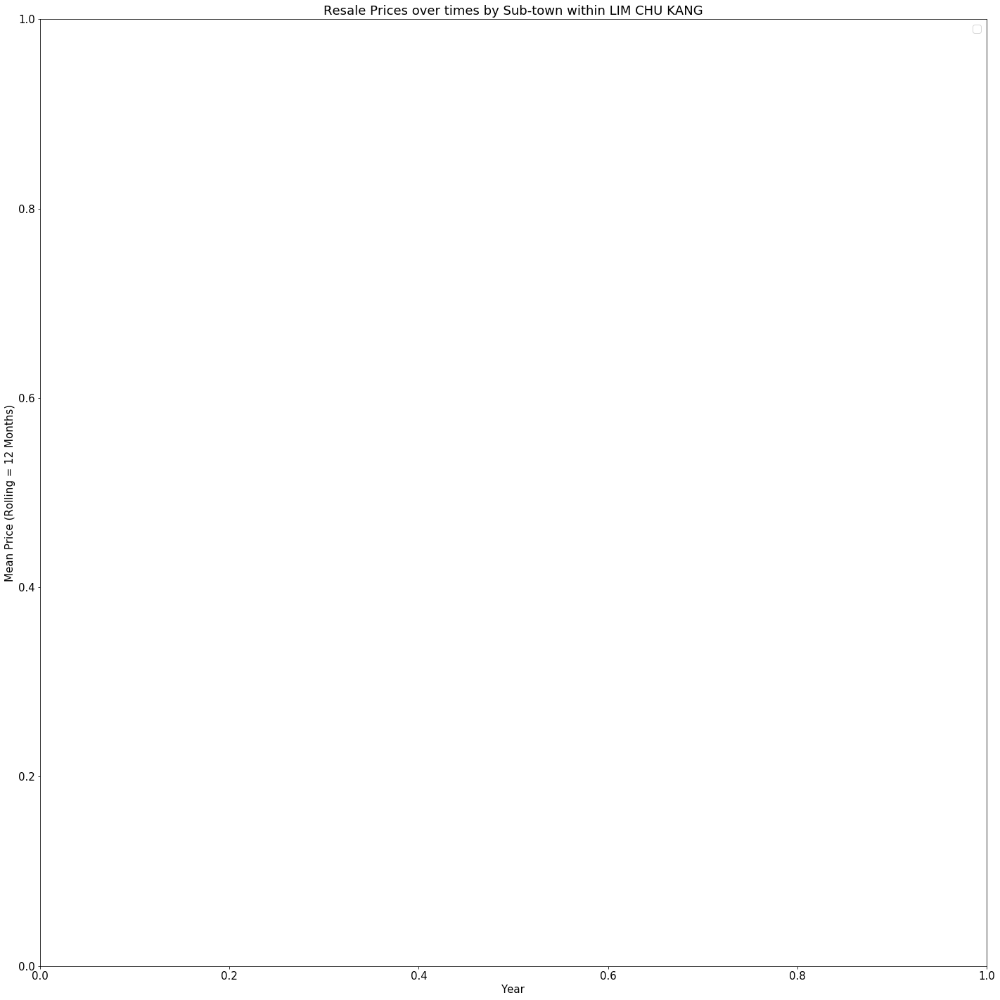

In [78]:
for town in data.town.unique():
    plot_prices(data, town, 12, show=True, focus=None)